In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.dataset.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.roboflow.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/split.py
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00108_jpg.rf.3335d7cd1850cfa9d60d5bf7b48b5f33.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/10_00103_jpg.rf.1549154b51978d775abdb07b0bbf8ed7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/6_00054_jpg.rf.e55a6a8deba73ad5807c903e5299991d.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00088_jpg.rf.a4abd94687414d676ac4047fb693d2d7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/3_00149_jpg.rf.cf5567a5c4ca41e0ac97599663a260e9.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/11_00031_jpg.rf.fb6cad24e

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 22.9 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


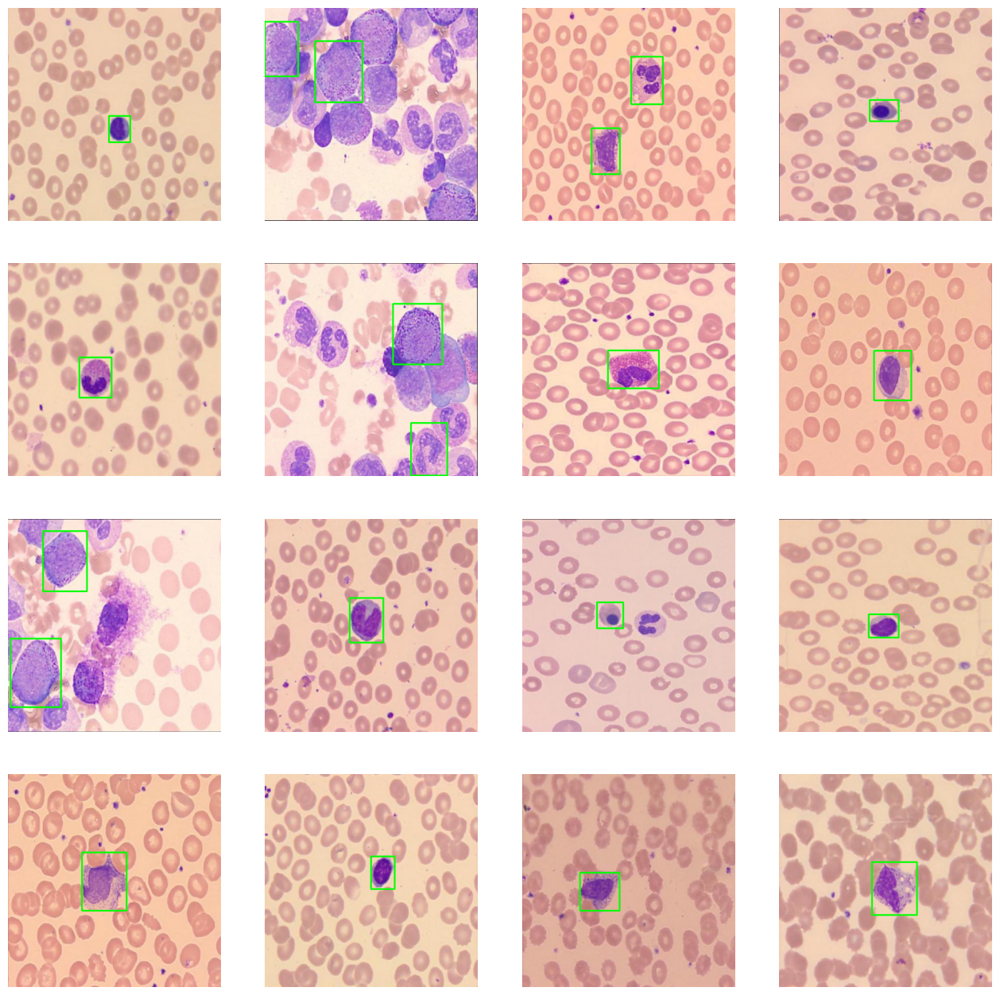

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images"
train_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels"

test_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images"
test_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels"

val_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/images"
val_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images/10_00001_jpg.rf.4fcbf927a55ca52647a1f9e5d1beb0b7.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 107MB/s]


In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,                                  
    device='0'                       
)


Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 24.2MB/s]
2024-10-11 20:46:52,257	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-11 20:46:52,846	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 115MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels... 5803 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5803/5803 [00:23<00:00, 248.85it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels... 717 images, 0 backgrounds, 0 corrupt: 100%|██████████| 717/717 [00:03<00:00, 217.32it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      2.34G     0.7985      3.513      1.018         16        640: 100%|██████████| 363/363 [01:04<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  3.88it/s]


                   all        717        809      0.369      0.601      0.445      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80       2.3G     0.7492        2.3      0.983         20        640: 100%|██████████| 363/363 [01:02<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.16it/s]

                   all        717        809      0.449      0.706      0.534      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      2.32G     0.7411      1.866      0.983         26        640: 100%|██████████| 363/363 [01:00<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.36it/s]

                   all        717        809      0.538      0.743      0.664      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80       2.3G     0.7215      1.582     0.9797         11        640: 100%|██████████| 363/363 [00:59<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.27it/s]

                   all        717        809      0.568      0.731      0.696      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80       2.3G     0.7115      1.409     0.9777         20        640: 100%|██████████| 363/363 [00:59<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.44it/s]

                   all        717        809      0.571      0.749      0.678      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      2.32G     0.6896      1.286     0.9659         19        640: 100%|██████████| 363/363 [00:59<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.38it/s]

                   all        717        809      0.647       0.78      0.766      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80       2.3G     0.6815      1.199     0.9663         15        640: 100%|██████████| 363/363 [00:59<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.32it/s]

                   all        717        809      0.702      0.754      0.785      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80       2.3G     0.6703      1.151     0.9599         18        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.36it/s]

                   all        717        809      0.716      0.719      0.773      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80       2.3G     0.6607      1.104     0.9579         23        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.37it/s]

                   all        717        809      0.648      0.771       0.77      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      2.32G     0.6536      1.064     0.9518         26        640: 100%|██████████| 363/363 [00:59<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.19it/s]

                   all        717        809      0.732      0.783      0.817      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      2.32G     0.6456      1.039     0.9506         14        640: 100%|██████████| 363/363 [00:59<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.43it/s]

                   all        717        809      0.683      0.789      0.795      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80       2.3G     0.6372     0.9849     0.9477         14        640: 100%|██████████| 363/363 [01:00<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.26it/s]

                   all        717        809      0.736       0.78      0.813      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      2.32G     0.6346     0.9676     0.9458         24        640: 100%|██████████| 363/363 [01:00<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.39it/s]

                   all        717        809      0.759      0.792      0.843       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80       2.3G     0.6316     0.9584     0.9494         20        640: 100%|██████████| 363/363 [01:00<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.29it/s]

                   all        717        809       0.76      0.799       0.84      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80       2.3G     0.6312      0.936     0.9467         21        640: 100%|██████████| 363/363 [01:00<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.25it/s]

                   all        717        809      0.793      0.808      0.852      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80       2.3G     0.6244      0.909     0.9488         16        640: 100%|██████████| 363/363 [01:00<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.33it/s]

                   all        717        809      0.753      0.804      0.852      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80       2.3G     0.6247     0.8907     0.9458         14        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.41it/s]

                   all        717        809      0.762      0.854       0.87      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80       2.3G     0.6188     0.8724     0.9404         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.34it/s]

                   all        717        809      0.783      0.852      0.873      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80       2.3G     0.6145     0.8574     0.9442         26        640: 100%|██████████| 363/363 [00:59<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.42it/s]

                   all        717        809      0.822      0.793      0.876      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80       2.3G     0.6114     0.8415     0.9397         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.28it/s]

                   all        717        809      0.773      0.838      0.862      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80       2.3G     0.6086      0.828     0.9415         15        640: 100%|██████████| 363/363 [01:00<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.40it/s]

                   all        717        809      0.813      0.853      0.889      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80       2.3G     0.5991     0.8061     0.9385         23        640: 100%|██████████| 363/363 [01:00<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.36it/s]

                   all        717        809      0.816      0.829      0.882      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80       2.3G     0.6055     0.7775     0.9358         14        640: 100%|██████████| 363/363 [01:00<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.26it/s]

                   all        717        809       0.84      0.834      0.901      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80       2.3G     0.6019     0.7999      0.938         26        640: 100%|██████████| 363/363 [01:00<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.27it/s]

                   all        717        809      0.815      0.842      0.901      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80       2.3G     0.6003     0.7769     0.9356         22        640: 100%|██████████| 363/363 [01:00<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.42it/s]

                   all        717        809      0.796      0.851      0.886      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80       2.3G     0.5936     0.7553     0.9353         12        640: 100%|██████████| 363/363 [01:00<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.33it/s]

                   all        717        809      0.814      0.832      0.889      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80       2.3G     0.5997     0.7454     0.9351         21        640: 100%|██████████| 363/363 [00:59<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.49it/s]

                   all        717        809      0.842      0.867      0.907      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80       2.3G      0.587     0.7277     0.9339         20        640: 100%|██████████| 363/363 [00:59<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.43it/s]

                   all        717        809      0.857      0.853      0.913      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80       2.3G     0.5907     0.7298     0.9364         15        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.52it/s]

                   all        717        809       0.84      0.817      0.896      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80       2.3G     0.5846     0.7049     0.9311         23        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.36it/s]

                   all        717        809      0.841      0.859      0.912      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80       2.3G     0.5856     0.6978     0.9375         24        640: 100%|██████████| 363/363 [00:59<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.35it/s]

                   all        717        809      0.866      0.842      0.917      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80       2.3G     0.5769     0.6685     0.9307         17        640: 100%|██████████| 363/363 [01:00<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.41it/s]

                   all        717        809      0.861      0.866      0.922      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80       2.3G     0.5799     0.6769     0.9315         21        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.35it/s]

                   all        717        809      0.841      0.859      0.907      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80       2.3G     0.5721     0.6755     0.9291         15        640: 100%|██████████| 363/363 [00:59<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.41it/s]

                   all        717        809      0.828      0.869      0.918       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80       2.3G     0.5783     0.6634     0.9343         28        640: 100%|██████████| 363/363 [00:58<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.29it/s]

                   all        717        809      0.873      0.861      0.924      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80       2.3G     0.5751     0.6296     0.9311         20        640: 100%|██████████| 363/363 [00:59<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.50it/s]

                   all        717        809      0.855      0.872      0.922      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80       2.3G     0.5757      0.649     0.9324         18        640: 100%|██████████| 363/363 [00:58<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.25it/s]

                   all        717        809      0.853      0.905      0.928      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80       2.3G     0.5682     0.6325     0.9307         19        640: 100%|██████████| 363/363 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.11it/s]

                   all        717        809      0.861      0.898      0.932      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      2.32G     0.5655     0.6252     0.9295         15        640: 100%|██████████| 363/363 [00:59<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.19it/s]

                   all        717        809      0.917      0.876      0.943      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80       2.3G     0.5661     0.6062     0.9294         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.10it/s]

                   all        717        809      0.876      0.908      0.938      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80       2.3G     0.5626     0.6007     0.9269         28        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.15it/s]

                   all        717        809      0.878      0.899      0.939       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80       2.3G     0.5629     0.5908     0.9283         24        640: 100%|██████████| 363/363 [00:59<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.18it/s]

                   all        717        809       0.88      0.893      0.938      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80       2.3G     0.5568     0.5731     0.9257         20        640: 100%|██████████| 363/363 [00:59<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.06it/s]

                   all        717        809      0.884       0.92      0.945      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      2.32G     0.5554     0.5731     0.9236         17        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.10it/s]

                   all        717        809      0.879      0.891      0.945      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80       2.3G     0.5597     0.5581       0.93         14        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.17it/s]

                   all        717        809      0.903      0.886      0.945       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80       2.3G     0.5522     0.5492     0.9261         25        640: 100%|██████████| 363/363 [00:58<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.22it/s]

                   all        717        809      0.917      0.897      0.953      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80       2.3G     0.5492     0.5519     0.9225         14        640: 100%|██████████| 363/363 [00:58<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.19it/s]

                   all        717        809      0.896       0.91      0.949      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80       2.3G     0.5472     0.5446     0.9253         21        640: 100%|██████████| 363/363 [00:58<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.12it/s]

                   all        717        809       0.91      0.894      0.948      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80       2.3G     0.5481     0.5395      0.928         15        640: 100%|██████████| 363/363 [00:58<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.25it/s]

                   all        717        809      0.903      0.906      0.952      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80       2.3G     0.5421     0.5314     0.9211         20        640: 100%|██████████| 363/363 [00:58<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.18it/s]

                   all        717        809      0.904      0.913       0.96      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80       2.3G     0.5426     0.5306     0.9202         22        640: 100%|██████████| 363/363 [00:58<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.20it/s]

                   all        717        809      0.912      0.909      0.954      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80       2.3G     0.5417     0.5098     0.9222         27        640: 100%|██████████| 363/363 [00:58<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.30it/s]

                   all        717        809      0.912      0.918      0.958      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80       2.3G     0.5367     0.5021     0.9216         24        640: 100%|██████████| 363/363 [00:58<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.10it/s]

                   all        717        809        0.9      0.937      0.958      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80       2.3G     0.5409     0.4999     0.9218         19        640: 100%|██████████| 363/363 [00:58<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.34it/s]

                   all        717        809      0.918      0.912      0.957      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80       2.3G     0.5416     0.5012     0.9241         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.24it/s]

                   all        717        809      0.911      0.916      0.959       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80       2.3G     0.5343     0.4841     0.9208         17        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.16it/s]

                   all        717        809      0.918      0.919      0.964      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80       2.3G     0.5358     0.4789      0.919         19        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.23it/s]

                   all        717        809      0.907      0.937      0.964      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80       2.3G     0.5218     0.4733     0.9172         23        640: 100%|██████████| 363/363 [00:59<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.13it/s]

                   all        717        809      0.914      0.906      0.957      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80       2.3G     0.5312     0.4735     0.9161         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.07it/s]

                   all        717        809       0.92      0.929      0.959      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80       2.3G     0.5198     0.4571     0.9141         21        640: 100%|██████████| 363/363 [00:59<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.22it/s]

                   all        717        809      0.931       0.91      0.964      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80       2.3G     0.5214     0.4549     0.9129         28        640: 100%|██████████| 363/363 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.26it/s]

                   all        717        809      0.933      0.911      0.962      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80       2.3G     0.5214     0.4587     0.9129         15        640: 100%|██████████| 363/363 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.14it/s]

                   all        717        809      0.949      0.909      0.967      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      2.31G     0.5167     0.4439     0.9083         14        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.12it/s]

                   all        717        809      0.943      0.902      0.964      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80       2.3G     0.5152     0.4357     0.9097         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.11it/s]

                   all        717        809      0.947      0.922      0.969      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80       2.3G     0.5121     0.4314     0.9075         23        640: 100%|██████████| 363/363 [00:59<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.26it/s]

                   all        717        809      0.935      0.943       0.97      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80       2.3G     0.5123     0.4304     0.9107         24        640: 100%|██████████| 363/363 [00:59<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.13it/s]

                   all        717        809      0.942      0.935      0.968      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80       2.3G     0.5084     0.4171     0.9082         21        640: 100%|██████████| 363/363 [00:58<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.20it/s]

                   all        717        809      0.942      0.925      0.967       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80       2.3G     0.5071     0.4138     0.9116         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.12it/s]

                   all        717        809      0.936      0.943      0.971      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80       2.3G     0.5062     0.4124     0.9033         23        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.25it/s]

                   all        717        809      0.949      0.934      0.972      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      2.32G      0.506     0.4157     0.9099         22        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.20it/s]

                   all        717        809      0.946      0.933      0.974      0.885


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      2.33G     0.4445     0.3207     0.8754         13        640: 100%|██████████| 363/363 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.18it/s]

                   all        717        809       0.95      0.927      0.973      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80       2.3G     0.4343     0.2947      0.865         11        640: 100%|██████████| 363/363 [00:58<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.15it/s]

                   all        717        809      0.943       0.93      0.973      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      2.29G     0.4366     0.2823     0.8709         11        640: 100%|██████████| 363/363 [00:57<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.30it/s]

                   all        717        809      0.931      0.952      0.974      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      2.29G     0.4307     0.2792     0.8681         13        640: 100%|██████████| 363/363 [00:57<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.33it/s]

                   all        717        809      0.935       0.95      0.975      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      2.29G     0.4289     0.2719     0.8696         11        640: 100%|██████████| 363/363 [00:57<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.52it/s]

                   all        717        809       0.96      0.929      0.977       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      2.32G     0.4274     0.2688     0.8649         11        640: 100%|██████████| 363/363 [00:57<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.42it/s]

                   all        717        809      0.945      0.949      0.976      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      2.28G     0.4236     0.2652     0.8631         13        640: 100%|██████████| 363/363 [00:59<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.52it/s]

                   all        717        809      0.946      0.946      0.977      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      2.29G     0.4209     0.2602     0.8639         11        640: 100%|██████████| 363/363 [00:57<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.55it/s]

                   all        717        809       0.95      0.936      0.977      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      2.29G     0.4196     0.2592     0.8614         11        640: 100%|██████████| 363/363 [00:57<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.37it/s]

                   all        717        809      0.965      0.926      0.977      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80       2.3G     0.4189     0.2557     0.8628         12        640: 100%|██████████| 363/363 [00:58<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.54it/s]

                   all        717        809      0.943      0.945      0.978      0.895



80 epochs completed in 1.438 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,686,708 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  4.55it/s]


                   all        717        809      0.943      0.945      0.978      0.895
   Atypical lymphocyte         62         72      0.941       0.88      0.977      0.853
       Band Neutrophil         63         73      0.828      0.959      0.944      0.864
              Basophil         72         73      0.986          1      0.995       0.91
                 Blast         28         63      0.966      0.892      0.952      0.881
            Eosinophil         58         59      0.994      0.983      0.988      0.897
            Lymphocyte         68         69       0.97      0.957      0.993      0.918
         Metamyelocyte         67         68      0.969      0.906      0.983      0.917
              Monocyte         55         57      0.934      0.991      0.979      0.915
             Myelocyte         56         62      0.876      0.935      0.971      0.857
                   NRC         53         58       0.96          1      0.994      0.911
          Promyelocyt

lr/pg0,█████▇▇▇▇▇▇▆▆▆▆▆▆▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁
lr/pg1,▃▆███▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▁▁
lr/pg2,████▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▄▄▄▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████████████
metrics/mAP50-95(B),▁▂▄▄▅▅▆▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████
metrics/precision(B),▁▃▃▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▆▇▇▇▇▇▇▇▇▇▇██████████
metrics/recall(B),▁▃▄▅▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇▇███████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▁▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a7ac2f75690>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

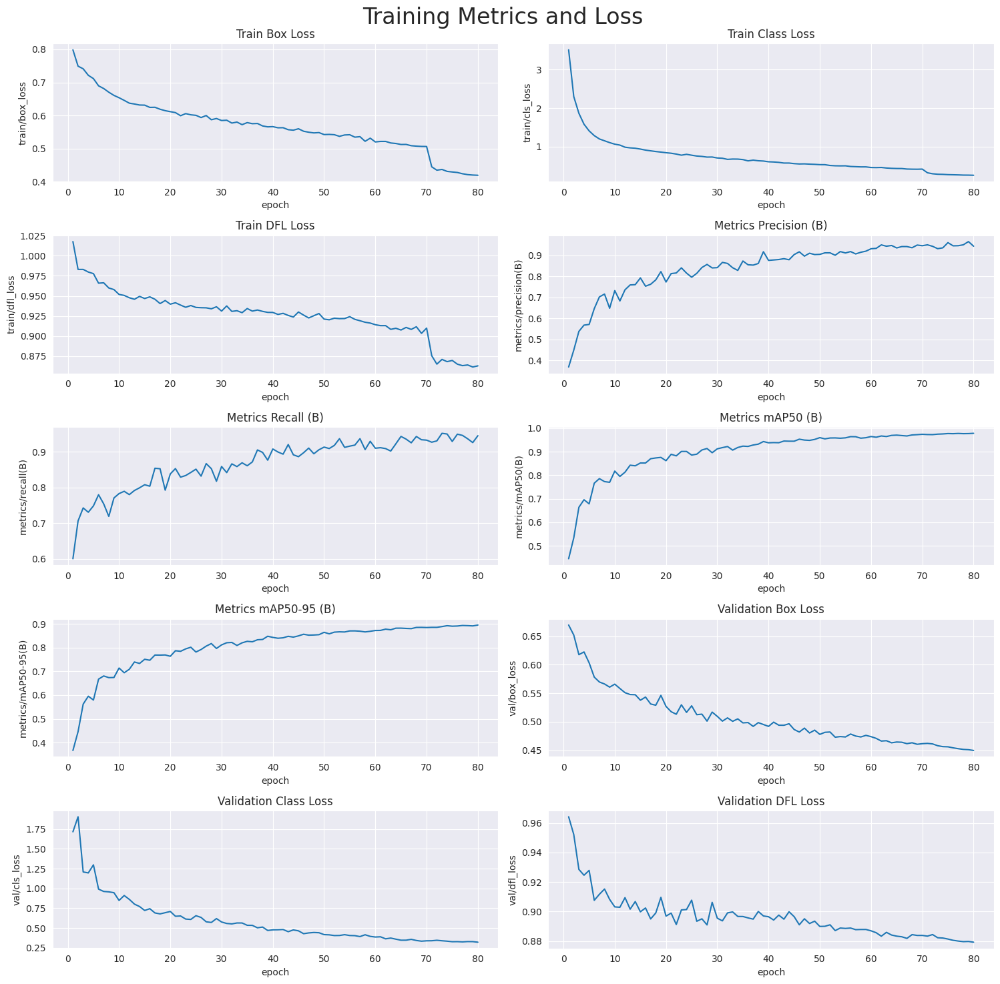

In [8]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [9]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 186 layers, 2,686,708 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels... 667 images, 0 backgrounds, 0 corrupt: 100%|██████████| 667/667 [00:02<00:00, 251.54it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:06<00:00,  6.71it/s]


                   all        667        817      0.771      0.813      0.819      0.736
   Atypical lymphocyte         98        105      0.923        0.8      0.883      0.758
       Band Neutrophil         80         99      0.785      0.737      0.785      0.732
              Basophil         90         99      0.967      0.889      0.942      0.855
                 Blast         54        121      0.941      0.917      0.945      0.868
         Metamyelocyte         86         87      0.717      0.816      0.766      0.706
             Myelocyte         82        100      0.704       0.69      0.719      0.615
                   NRC         87         91      0.848      0.923      0.929      0.791
          Promyelocyte         73         92      0.748      0.935      0.878      0.811
  Segmented neutrophil         20         23      0.304      0.609      0.523      0.485
Speed: 0.2ms preprocess, 3.7ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect

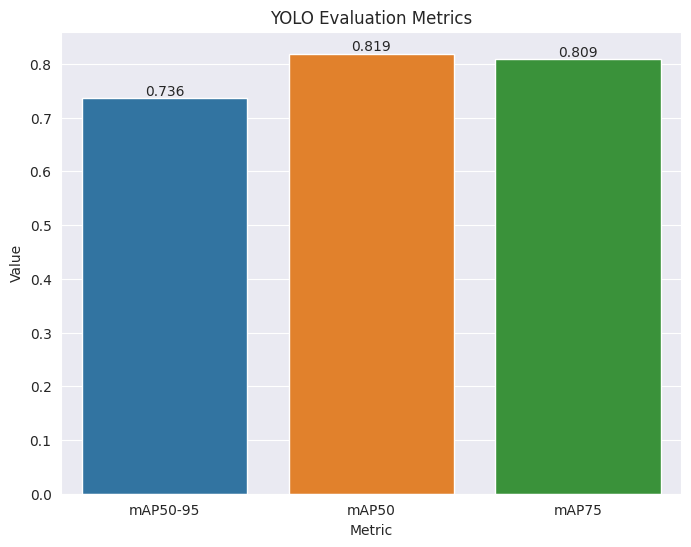

In [10]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

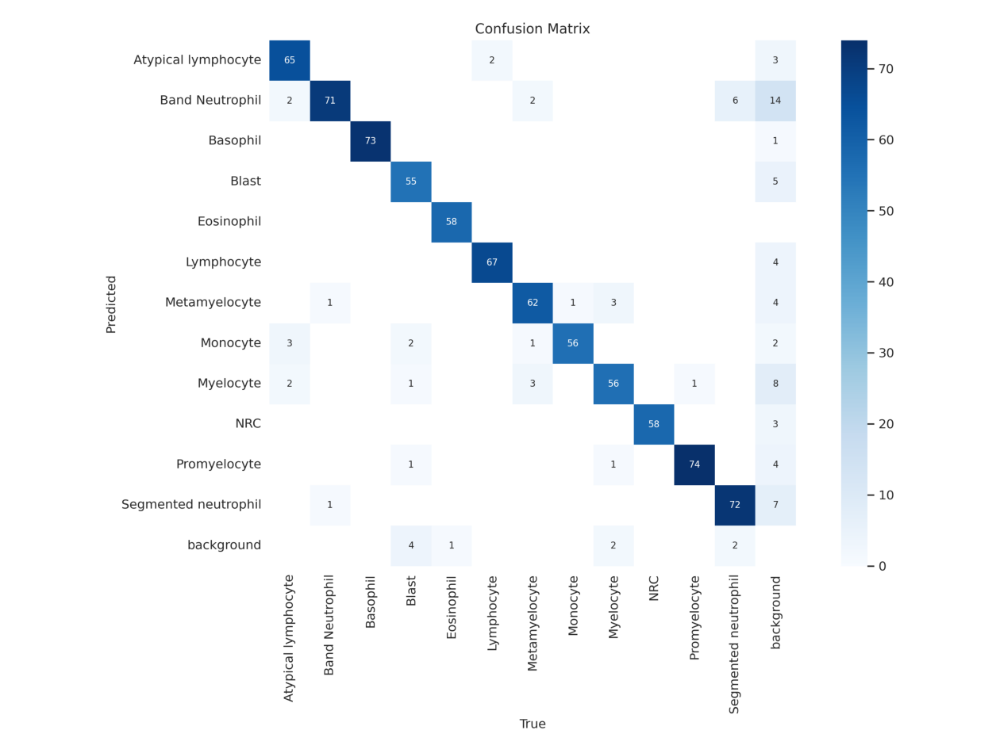

In [11]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

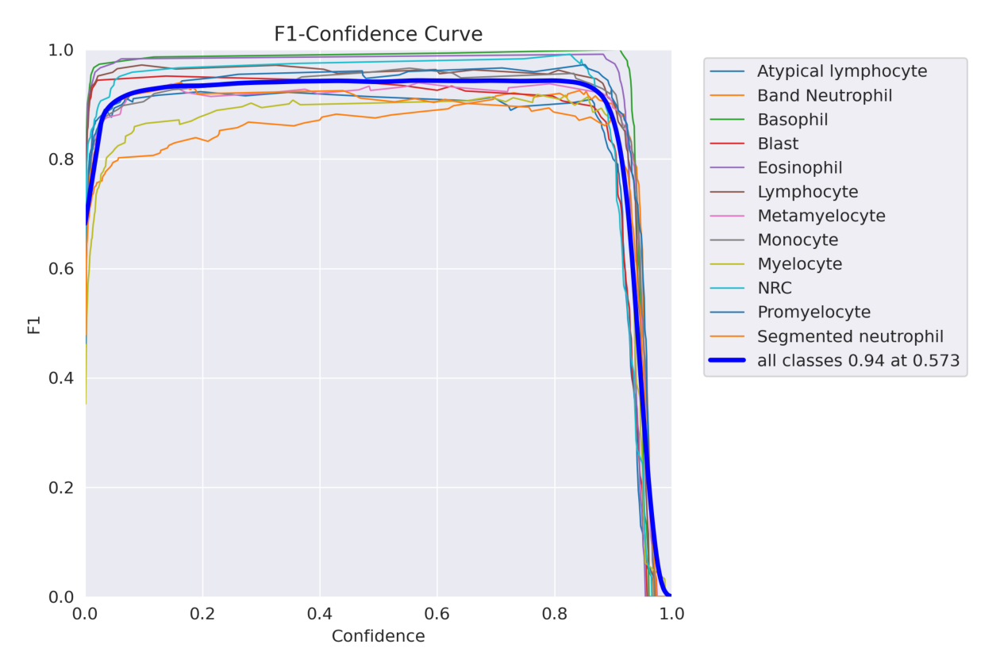

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

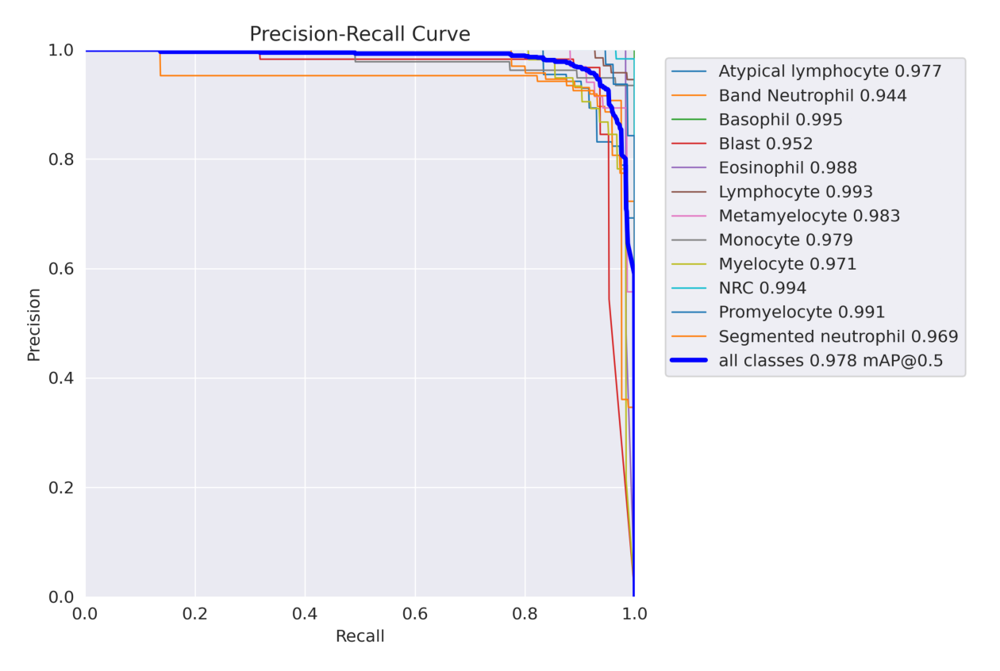

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

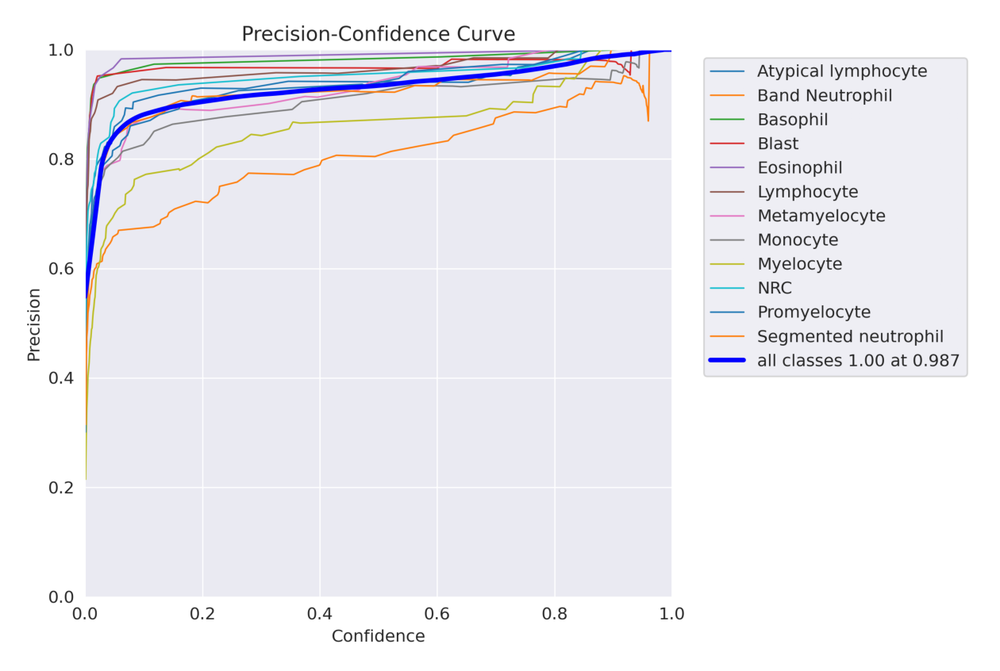

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/P_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

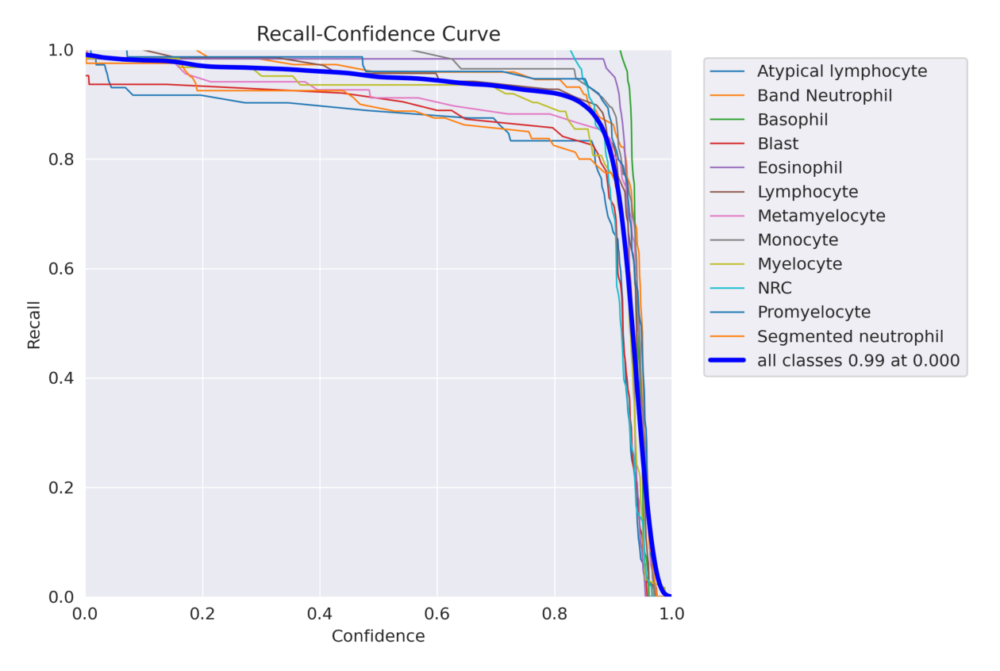

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/R_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

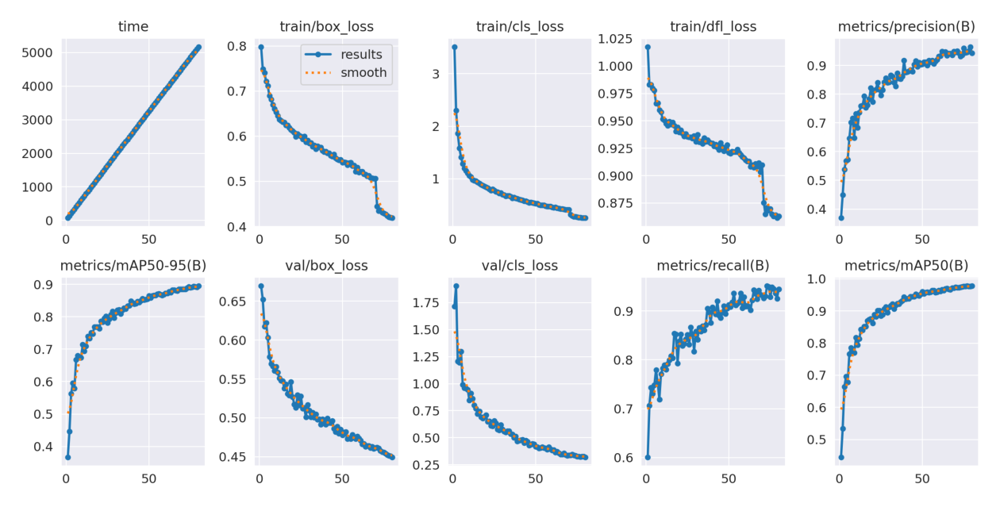

In [16]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/results.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [17]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Atypical lymphocyte, 8.3ms
Speed: 4.0ms preprocess, 8.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Promyelocyte, 7.2ms
Speed: 1.7ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NRC, 7.2ms
Speed: 1.6ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 7.2ms
Speed: 1.8ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Myelocyte, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 7.2ms
Speed: 1.7ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.4ms postprocess per ima

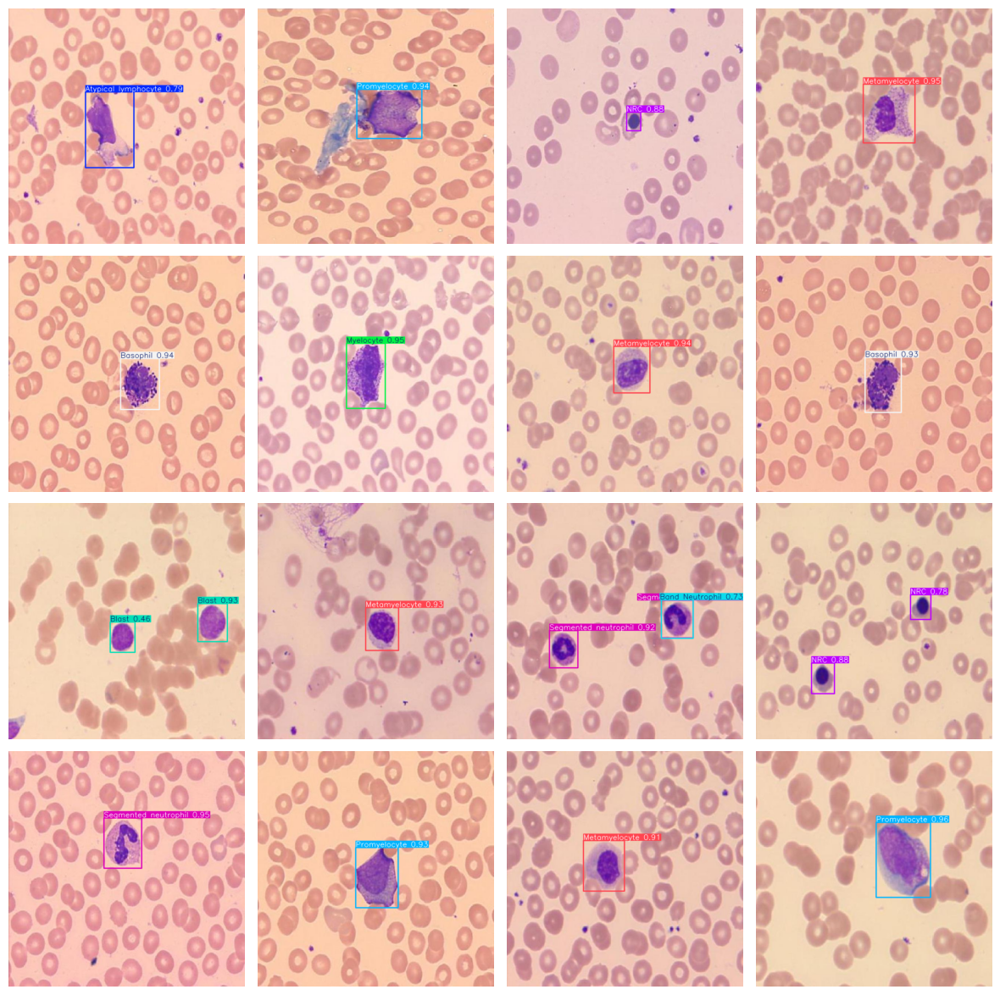

In [18]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [19]:
# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/detect/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.4,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00004_jpg.rf.33467f06547bca1934fbe5b5de747cf6.jpg: 640x640 1 Basophil, 7.2ms
image 2/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00006_jpg.rf.28e543e681b9d7532c911330ca0227b1.jpg: 640x640 1 Basophil, 7.1ms
image 3/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00010_jpg.rf.a8602ac6d9d1bff63810a82ee50fb04c.jpg: 640x640 1 Basophil, 7.1ms
image 4/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00016_jpg.rf.4ad41e92e2133917baccddeed12fc2f7.jpg: 640x640 1 Basophil, 7.1ms
image 5/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00026_jpg.rf.2a2c868b960df62918cbabd6cfcc5c24.jpg: 640x640 1 Basophil, 7.1ms
image 6/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00031_jpg.rf.9cadd0cc75ee9d59ea73a974e92e60f8.jpg: 640x640 1 Basophil, 7.1ms
image 7/667 /kaggle/i

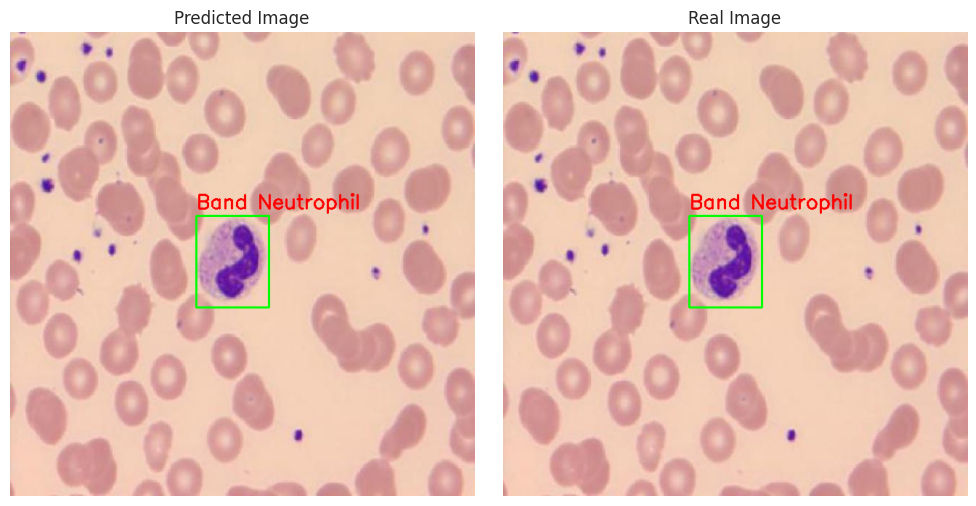

In [20]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


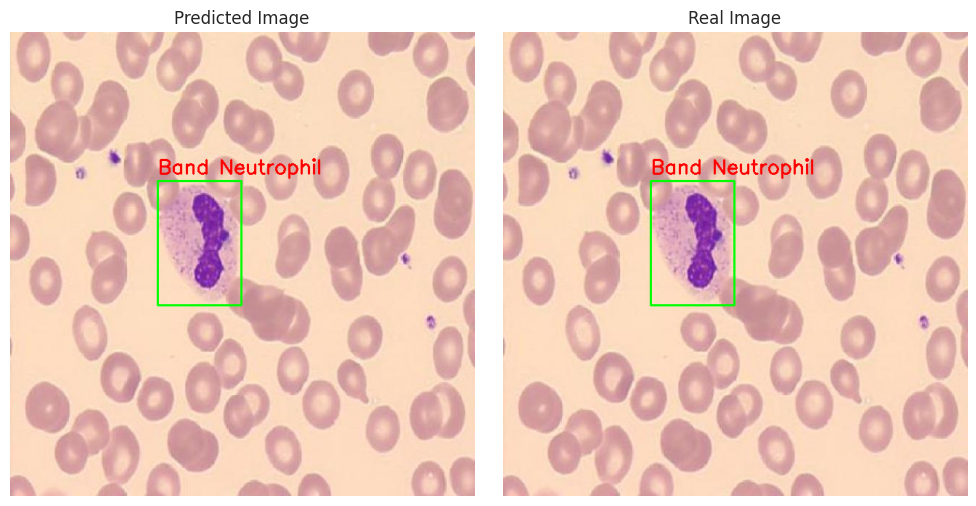

In [21]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


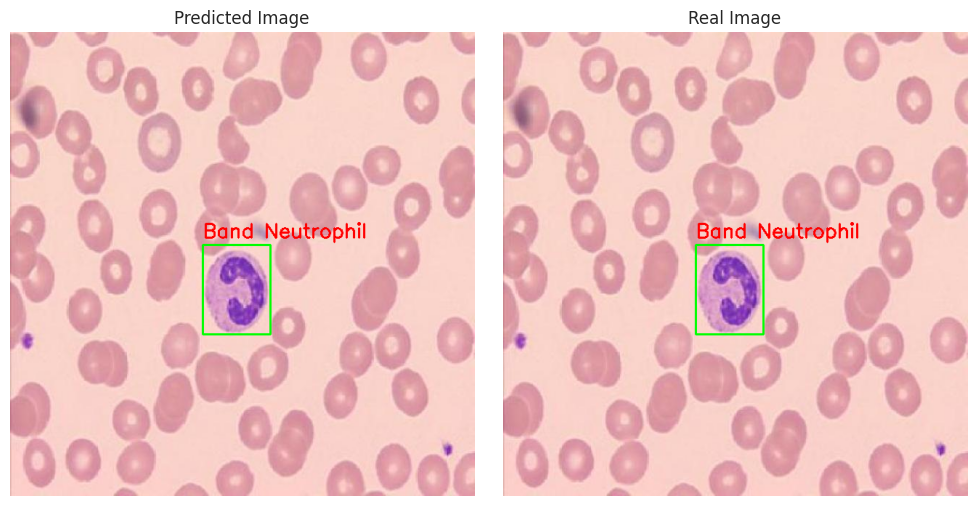

In [22]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


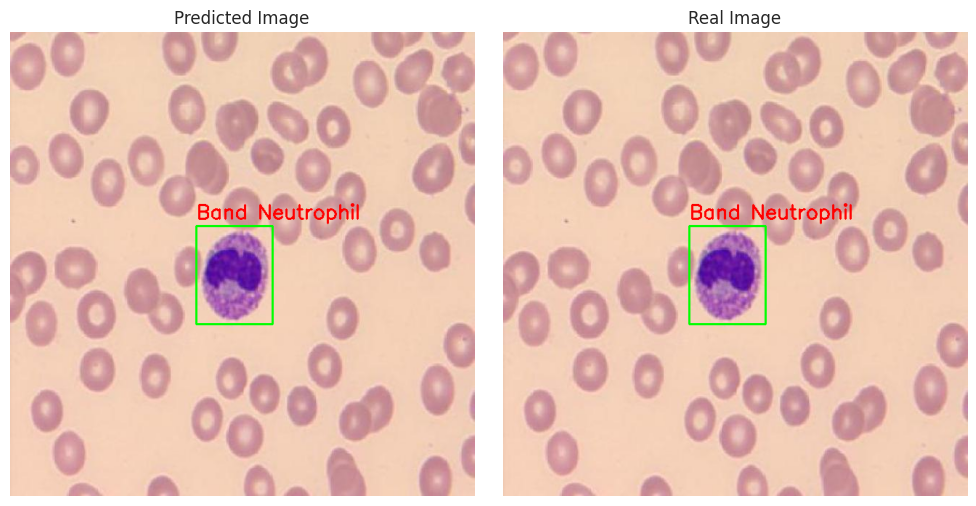

In [23]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


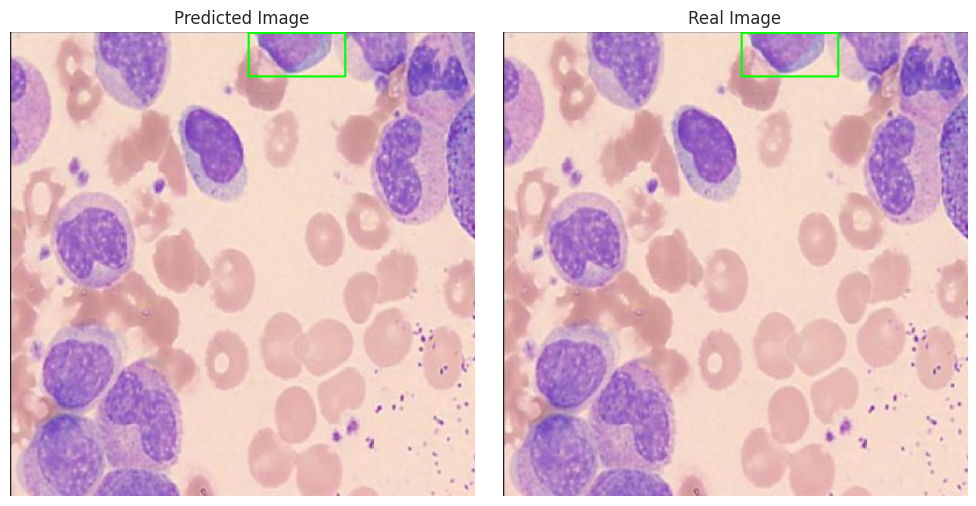

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


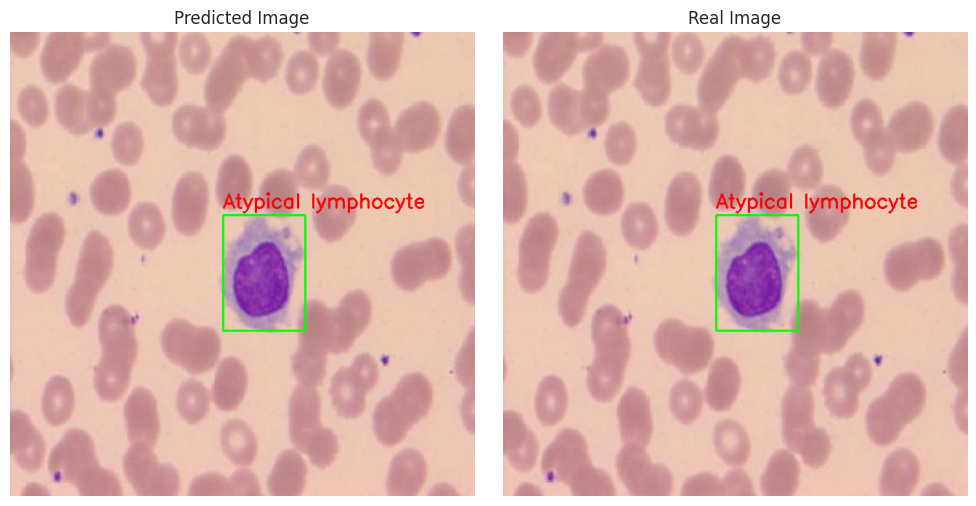

In [25]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


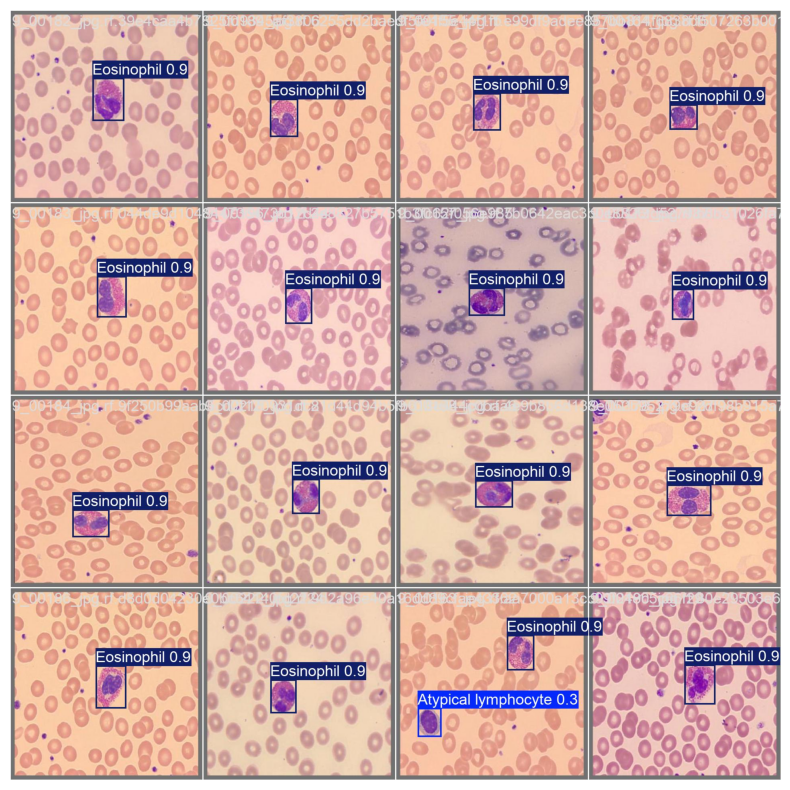

In [29]:
from PIL import Image  # Importing the Image module from PIL
import matplotlib.pyplot as plt

image_path = '/kaggle/working/runs/detect/train/val_batch0_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.axis('off')  # Optional: To hide the axes
plt.show()


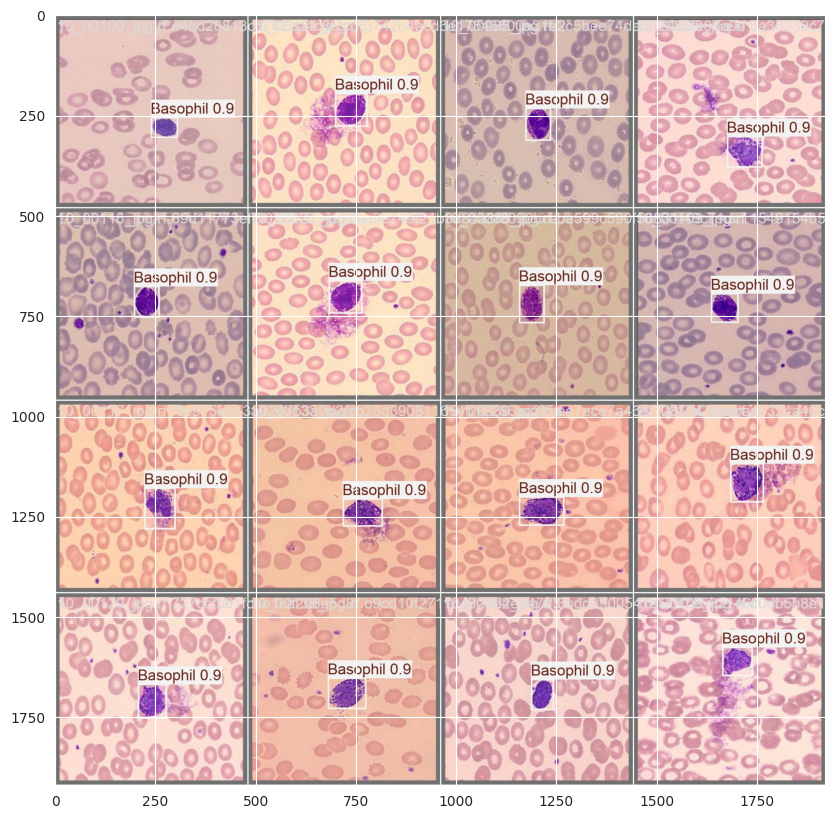

In [30]:
image_path = '/kaggle/working/runs/detect/train/val_batch1_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()